# MMM (Marketing Mix Modeling)

#### The data set contains the chanel spends for 5 channels ooh_s, tv_s, print_s, search_s and facebook_s and the total revenue. We also have data for facebook impressions generated. However to incorporate the impressions into the model, we need to calculate the cost per impression (CPI) for Facebook and then use it as a feature in the model. This is out of scope of this notbook. For control variable we have competitor sales that can be included in the model as well.

#### The objective here is to see various out of the box capabilities of PyMC MMM API and to see how quickly we can build a model and get the results.

In [81]:
import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

In [82]:
# !pip install -q pymc-marketing

In [83]:
import pymc as pm
print(pm.__version__)

5.25.1


In [84]:
import warnings

import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

from pymc_marketing.mmm import MMM, GeometricAdstock, LogisticSaturation, MichaelisMentenSaturation
from pymc_marketing.mmm.transformers import geometric_adstock, logistic_saturation
from pymc_marketing.prior import Prior

warnings.filterwarnings("ignore", category=FutureWarning)

az.style.use("arviz-darkgrid")
plt.rcParams["figure.figsize"] = [12, 7]
plt.rcParams["figure.dpi"] = 100

%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = "retina"

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [85]:
%config InlineBackend.figure_format = 'retina'
# Initialize random number generator
RANDOM_SEED = 8927
rng = np.random.default_rng(RANDOM_SEED)
az.style.use("arviz-darkgrid")

In [86]:
# import data
pd_sales_data = pd.read_csv('../data/de_simulated_data.csv')
pd_holiday_data = pd.read_csv('../data/dt_prophet_holidays.csv')

In [87]:
pd_sales_data.shape

(208, 10)

In [88]:
pd_sales_data.head()

,DATE,revenue,tv_S,ooh_S,print_S,facebook_I,search_clicks_P,search_S,competitor_sales_B,facebook_S
0,2015-11-23,2.754372e+06,167687.6,0,95463.666667,7.290385e+07,0.000000,0,8125009,228213.987444
1,2015-11-30,2.584277e+06,214600.9,0,0.000000,1.658110e+07,29511.715457,31000,7901549,34258.573511
2,2015-12-07,2.547387e+06,0.0,248022,3404.000000,4.995477e+07,36132.358958,28400,8300197,127691.261335
3,2015-12-14,2.875220e+06,625877.3,0,132600.000000,3.164930e+07,36804.210958,31900,8122883,84014.720306
4,2015-12-21,2.215953e+06,0.0,520005,0.000000,8.802269e+06,28401.744069,27100,7105985,20687.478156


In [89]:
# Filter out holiday data for Germany
pd_holiday_data_de = pd_holiday_data[pd_holiday_data['country']=='DE']

In [90]:
# update the holiday data in the sales datafram
import pandas as pd

# Convert 'DATE' in sales data to datetime
pd_sales_data.loc[:, 'DATE'] = pd.to_datetime(pd_sales_data['DATE'], format='%Y-%m-%d')

# Convert 'ds' in holiday data to datetime
pd_holiday_data_de.loc[:, 'ds'] = pd.to_datetime(pd_holiday_data_de['ds'], format='%Y-%m-%d')

# Create a set of all holiday dates for faster lookup
holiday_dates = set(pd_holiday_data_de['ds'])

# Assign 1 if date is holiday, else 0
pd_sales_data.loc[:, 'holiday'] = pd_sales_data['DATE'].isin(holiday_dates).astype(int)

In [91]:
pd_sales_data[pd_sales_data["holiday"]==1].head()

,DATE,revenue,tv_S,ooh_S,print_S,facebook_I,search_clicks_P,search_S,competitor_sales_B,facebook_S,holiday
18,2016-03-28 00:00:00,2.103937e+06,0.0,123916,101845.666667,8.024168e+07,18271.145388,19000,4506918,194131.452156,1
25,2016-05-16 00:00:00,1.915375e+06,0.0,0,0.000000,5.075597e+07,0.000000,0,3039148,110217.923219,1
45,2016-10-03 00:00:00,2.232910e+06,1084024.8,228506,73598.666667,4.267954e+07,28940.127379,25300,6395275,94415.030784,1
57,2016-12-26 00:00:00,3.659425e+06,807907.6,0,0.000000,6.853705e+07,77849.585996,58000,7730351,216796.440186,1
73,2017-04-17 00:00:00,1.955282e+06,56017.9,0,0.000000,0.000000e+00,27251.503397,26600,3057885,0.000000,1


In [92]:
pd_sales_data = pd_sales_data.drop(columns=['search_clicks_P', 'facebook_I'])

In [93]:
pd_sales_data['revenue'].sum()

np.float64(379005696.6666667)

In [94]:
df_monthly_sales_grouped = pd_sales_data[['DATE', 'tv_S', 'ooh_S', 'print_S', 'search_S', 'facebook_S']]

In [95]:
# Create yyyy-mm column
df_monthly_sales_grouped = df_monthly_sales_grouped.copy()
df_monthly_sales_grouped['DATE'] = pd.to_datetime(df_monthly_sales_grouped['DATE'])
df_monthly_sales_grouped['year_month'] = df_monthly_sales_grouped['DATE'].dt.to_period('M').astype(str)
df_monthly_sales_grouped.drop('DATE', axis=1, inplace=True)

In [96]:
df_monthly_sales_grouped = df_monthly_sales_grouped.groupby('year_month').sum()

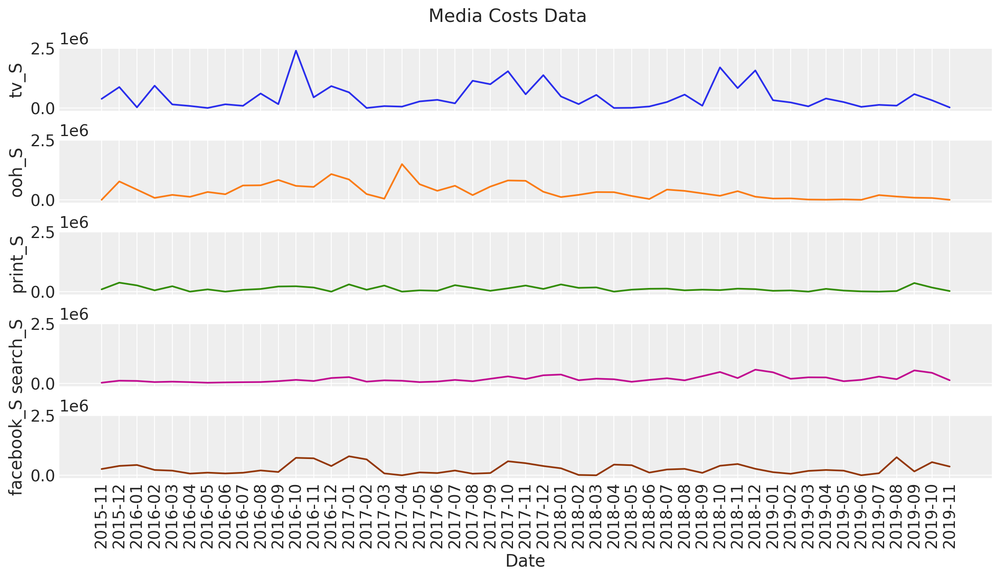

In [97]:
# Media data
channel_spends = ['tv_S', 'ooh_S', 'print_S', 'search_S', 'facebook_S']

fig, ax = plt.subplots(
    nrows=5, ncols=1, figsize=(12, 7), sharex=True, sharey=True, layout="constrained"
)

for i, channel_spend in enumerate(channel_spends):
    sns.lineplot(x="year_month", y=channel_spend, data=df_monthly_sales_grouped, color=f"C{i}", ax=ax[i])
    ax[i].set_ylabel(channel_spend)

ax[-1].set_xlabel("Date")
fig.suptitle("Media Costs Data", fontsize=16)
plt.xticks(rotation=90)
plt.show()

There is a high spend of ooh followed by tv. Let's see the revenue across all the channels

In [98]:
df_total_sales = df_monthly_sales_grouped.copy()
df_total_sales = df_total_sales.reset_index(drop=True)


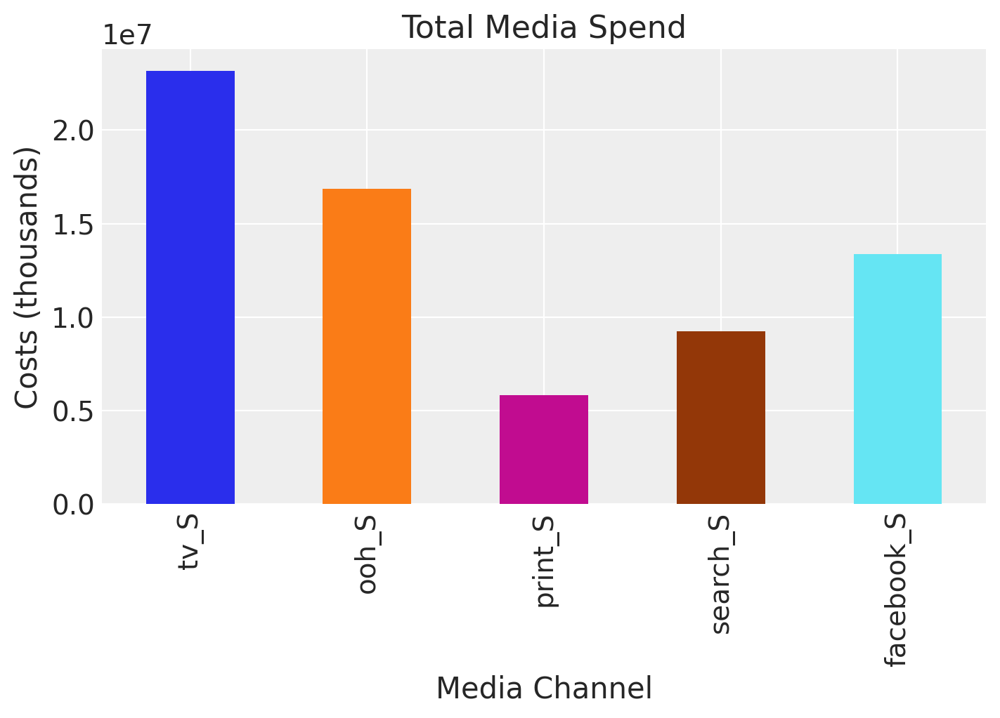

In [99]:
fig, ax = plt.subplots(figsize=(7, 5))
df_total_sales[['tv_S', 'ooh_S', 'print_S', 'search_S', 'facebook_S']].sum().plot(kind="bar", color=["C0", "C1", "C3", "C4", "C5"], ax=ax)
ax.set(title="Total Media Spend", xlabel="Media Channel", ylabel="Costs (thousands)");

# MMM Model Specification
### How to select the priors

The model structure is provided by the **MMM** class. This class handles lots of things for us. *Example, scaling the features (MaxAbsSclar from scikit-learn), providing tools to analyse and plot the observations/results*.



## Model Parameters

*   **Intercept**: Represent base line level of dependent variable, i.e the value of y (sales/revenue etc) when iputs are 0. Normal prior distribution with mu=0 and std dev = 2 means the value of y is between -2 to +2 when inputs are zero

*   **Likelihood**: Defines the distribution of the residual errors (how much actual sales deviates from model predictions). Prior for likelihood is normal since we expect the errors to be normally distributed. So for any normal distribution we specify mu and sigma, here the sigma is unknown we want to learn this from the data hence we are specifying a distribution not the value itself. But we know that the SD must be +ve hence specifying the halfnormal prior that strictly considers positive values only.

*   **gamma_control**: Coefficients of the control variables (competitors sales data, events, holidays, etc) that estimates the influence of these over **y** (revenue /sales etc) . We will use normal prior for this.

*   **gamma_fourier**: Coefficients of seasonality features to model for monthly, yearly sesonality. Helps model learn periodic patterns in data like holidays, strikes, summer dips etc. We use Laplace prior to drive the small co-efficients to zero in other words encourages most gamma fourier values to zero to remove unnecessary sesonality terms only relevant patterns are kept.

*   **adstock_alpha**: Decay rate of media impact overtime. Normally Beta prior is used which is Skewed towards lower values to model the fact that recent media spend has more impact. Controls how long lasting the each channel's impact. high Alpha - slow decay , low alpha - fast decay.

*   **saturation_lam**: Controls the steepness of saturation curve. This helps model the saturation effect of an ad after initial investment. Gamma distribution for prior allows for positive skewed distribution. High lambda means media saturates quickly.

*   **saturation_beta**: Scaling factor in the logistic saturation function. Controls the maximum contribution a channel can make. Sets a prior belief about how big the impact of each media channel can be, ensuring positivity.


## Can we set perfect priors?

If the priors are well know then it's good for the model. Priors are usually known for old models which are optimized from a long time or from known standards. Randomly chosen priors are ok if we have large data, if the data is small then at least weakly set priors according to some criteria makes a big impact to the model.

The prior distributions along with the parameters are set as per industry standard for each media type for this example.


In [100]:
# calculate spend share of each channels, this is to set the prior Sigma for each channel

total_spend_per_channel = pd_sales_data[['tv_S', 'ooh_S', 'print_S', 'search_S', 'facebook_S']].sum(axis=0)

spend_share = total_spend_per_channel / total_spend_per_channel.sum()

spend_share

tv_S          0.338318
ooh_S         0.246256
print_S       0.084983
search_S      0.134827
facebook_S    0.195616
dtype: float64

In [101]:
n_channels = 5

HALF_NORMAL_SCALE = 1 / np.sqrt(1 - 2 / np.pi)
prior_sigma = HALF_NORMAL_SCALE * n_channels * spend_share.to_numpy()

prior_sigma.tolist()

[2.8061740654561564,
 2.042569187944328,
 0.7048914591334415,
 1.1183174331142183,
 1.6225315542033876]

#### Though we can use the above as beta prior in our model I am not using them while building the model. Again I just wanted to experiment with pre defined parameters and see how the model performs.

## Feature Engineering

In [102]:
pd_sales_data_fe = pd_sales_data.copy()

In [103]:
pd_sales_data_fe['DATE'] = pd.to_datetime(pd_sales_data_fe['DATE'])

In [104]:
pd_sales_data_fe.head()

,DATE,revenue,tv_S,ooh_S,print_S,search_S,competitor_sales_B,facebook_S,holiday
0,2015-11-23,2.754372e+06,167687.6,0,95463.666667,0,8125009,228213.987444,0
1,2015-11-30,2.584277e+06,214600.9,0,0.000000,31000,7901549,34258.573511,0
2,2015-12-07,2.547387e+06,0.0,248022,3404.000000,28400,8300197,127691.261335,0
3,2015-12-14,2.875220e+06,625877.3,0,132600.000000,31900,8122883,84014.720306,0
4,2015-12-21,2.215953e+06,0.0,520005,0.000000,27100,7105985,20687.478156,0


In [105]:
# Extract YEAR, MONTH, and DAY_OF_YEAR from DATE
pd_sales_data['DATE'] = pd.to_datetime(pd_sales_data['DATE'])
pd_sales_data_fe.loc[:, 'YEAR'] = pd_sales_data['DATE'].dt.year
pd_sales_data_fe.loc[:, 'MONTH'] = pd_sales_data['DATE'].dt.month
pd_sales_data_fe.loc[:, 'DAY_OF_YEAR'] = pd_sales_data['DATE'].dt.dayofyear

In [106]:
# trend feature
pd_sales_data_fe["t"] = range(pd_sales_data_fe.shape[0])

pd_sales_data_fe.head()

,DATE,revenue,tv_S,ooh_S,print_S,search_S,competitor_sales_B,facebook_S,holiday,YEAR,MONTH,DAY_OF_YEAR,t
0,2015-11-23,2.754372e+06,167687.6,0,95463.666667,0,8125009,228213.987444,0,2015,11,327,0
1,2015-11-30,2.584277e+06,214600.9,0,0.000000,31000,7901549,34258.573511,0,2015,11,334,1
2,2015-12-07,2.547387e+06,0.0,248022,3404.000000,28400,8300197,127691.261335,0,2015,12,341,2
3,2015-12-14,2.875220e+06,625877.3,0,132600.000000,31900,8122883,84014.720306,0,2015,12,348,3
4,2015-12-21,2.215953e+06,0.0,520005,0.000000,27100,7105985,20687.478156,0,2015,12,355,4


In [107]:
from sklearn.preprocessing import MaxAbsScaler
import pandas as pd

# Initialize scalers
scalar = MaxAbsScaler()

for control in ['t', 'DAY_OF_YEAR', 'YEAR' , 'MONTH', 'competitor_sales_B']:
    pd_sales_data_fe[control] = scalar.fit_transform(pd_sales_data_fe[[control]])

In [108]:
pd_sales_data_fe.head()

,DATE,revenue,tv_S,ooh_S,print_S,search_S,competitor_sales_B,facebook_S,holiday,YEAR,MONTH,DAY_OF_YEAR,t
0,2015-11-23,2.754372e+06,167687.6,0,95463.666667,0,0.813743,228213.987444,0,0.998019,0.916667,0.895890,0.000000
1,2015-11-30,2.584277e+06,214600.9,0,0.000000,31000,0.791362,34258.573511,0,0.998019,0.916667,0.915068,0.004831
2,2015-12-07,2.547387e+06,0.0,248022,3404.000000,28400,0.831288,127691.261335,0,0.998019,1.000000,0.934247,0.009662
3,2015-12-14,2.875220e+06,625877.3,0,132600.000000,31900,0.813530,84014.720306,0,0.998019,1.000000,0.953425,0.014493
4,2015-12-21,2.215953e+06,0.0,520005,0.000000,27100,0.711684,20687.478156,0,0.998019,1.000000,0.972603,0.019324


## Model Specification

In [109]:
channel_columns = ['tv_S', 'ooh_S', 'print_S', 'search_S', 'facebook_S']
control_columns = ['t', 'holiday']

In [110]:
X = pd_sales_data_fe.drop(['revenue'], axis=1)
y = pd_sales_data_fe['revenue']

### Important point about scaling



*   PyMC automatically scales the channel columns (spend data) and y (revenue for ex) using scikit_learn's MaxAbsScalar() metod
*   Control data: PyMC doesn't scale the control data automatically, any control data is to be scaled manually.



In [111]:
X

,DATE,tv_S,ooh_S,print_S,search_S,competitor_sales_B,facebook_S,holiday,YEAR,MONTH,DAY_OF_YEAR,t
0,2015-11-23,167687.6,0,95463.666667,0,0.813743,228213.987444,0,0.998019,0.916667,0.895890,0.000000
1,2015-11-30,214600.9,0,0.000000,31000,0.791362,34258.573511,0,0.998019,0.916667,0.915068,0.004831
2,2015-12-07,0.0,248022,3404.000000,28400,0.831288,127691.261335,0,0.998019,1.000000,0.934247,0.009662
3,2015-12-14,625877.3,0,132600.000000,31900,0.813530,84014.720306,0,0.998019,1.000000,0.953425,0.014493
4,2015-12-21,0.0,520005,0.000000,27100,0.711684,20687.478156,0,0.998019,1.000000,0.972603,0.019324
...,...,...,...,...,...,...,...,...,...,...,...,...
203,2019-10-14,0.0,60433,153723.666667,112100,0.762440,0.000000,0,1.000000,0.833333,0.786301,0.980676
204,2019-10-21,154917.6,0,0.000000,103700,0.671191,133624.575524,0,1.000000,0.833333,0.805479,0.985507
205,2019-10-28,21982.5,14094,17476.000000,114700,0.770067,0.000000,0,1.000000,0.833333,0.824658,0.990338
206,2019-11-04,22453.0,0,24051.333333,134100,0.882918,0.000000,0,1.000000,0.916667,0.843836,0.995169


In [112]:
dummy_model = MMM(
    date_column="",
    channel_columns=[""],
    adstock=GeometricAdstock(l_max=8),
    saturation=LogisticSaturation(),
)
dummy_model.default_model_config

{'intercept': Prior("Normal", mu=0, sigma=2),
 'likelihood': Prior("Normal", sigma=Prior("HalfNormal", sigma=2)),
 'gamma_control': Prior("Normal", mu=0, sigma=2, dims="control"),
 'gamma_fourier': Prior("Laplace", mu=0, b=1, dims="fourier_mode"),
 'adstock_alpha': Prior("Beta", alpha=1, beta=3, dims="channel"),
 'saturation_lam': Prior("Gamma", alpha=3, beta=1, dims="channel"),
 'saturation_beta': Prior("HalfNormal", sigma=2, dims="channel")}

In [113]:
# ['tv_S', 'ooh_S', 'print_S', 'search_S', 'facebook_S']
custom_model_config = {
    "saturation_alpha": Prior("HalfNormal", sigma=prior_sigma, dims="channel"),
}

In [114]:
custom_sampler_config = {"progressbar": True}

In [115]:
mmm = MMM(
    model_config=custom_model_config,
    sampler_config=custom_sampler_config,
    date_column="DATE",
    adstock=GeometricAdstock(l_max=8),
    saturation=LogisticSaturation(),
    channel_columns=channel_columns,
    control_columns=control_columns,
    # yearly_seasonality=2,
)

Sampling: [adstock_alpha, gamma_control, intercept, saturation_beta, saturation_lam, y, y_sigma]


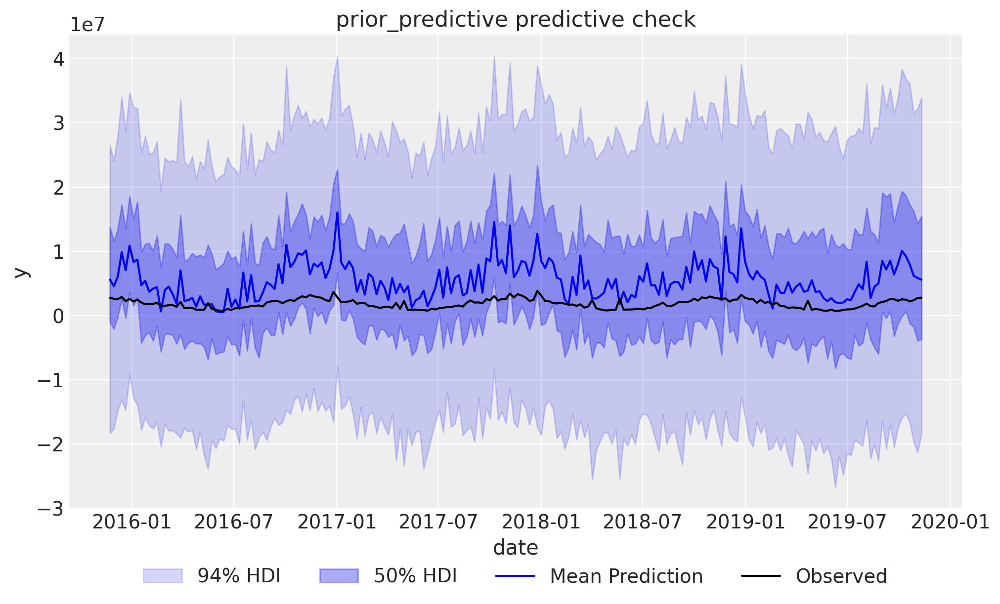

In [116]:
# Generate prior predictive samples
mmm.sample_prior_predictive(X, y, samples=2_000)

fig, ax = plt.subplots(figsize=(10, 6))
mmm.plot_prior_predictive(ax=ax, original_scale=True)
ax.legend(loc="lower center", bbox_to_anchor=(0.5, -0.2), ncol=4);

As we can see the priors are not too informative

## Model Fitting

In [117]:
# !pip install -q numpyro

In [118]:
mmm.fit(X=X, y=y, draws=1000, tune=1000, chains=2, target_accept=0.95, nuts_sampler="numpyro", random_seed=rng)

Running chain 0: 100%|██████████| 2000/2000 [00:09<00:00, 204.73it/s]
We recommend running at least 4 chains for robust computation of convergence diagnostics


/Users/vadi/D/21.Projects/Portfolio Projects/MMM/MMM/MMM_portfolio/lib/python3.11/site-packages/rich/live.py:256: 
UserWarning: install "ipywidgets" for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

Inference data with groups:
	> posterior
	> sample_stats
	> prior
	> prior_predictive
	> observed_data
	> constant_data
	> fit_data

In [119]:
print(X is None)
print(y is None)

False
False


In [120]:
type(mmm.model)

pymc.model.core.Model

In [121]:
print(f"Model was trained using the {mmm.saturation.__class__.__name__} function")
print(f"and the {mmm.adstock.__class__.__name__} function")

Model was trained using the LogisticSaturation function
and the GeometricAdstock function


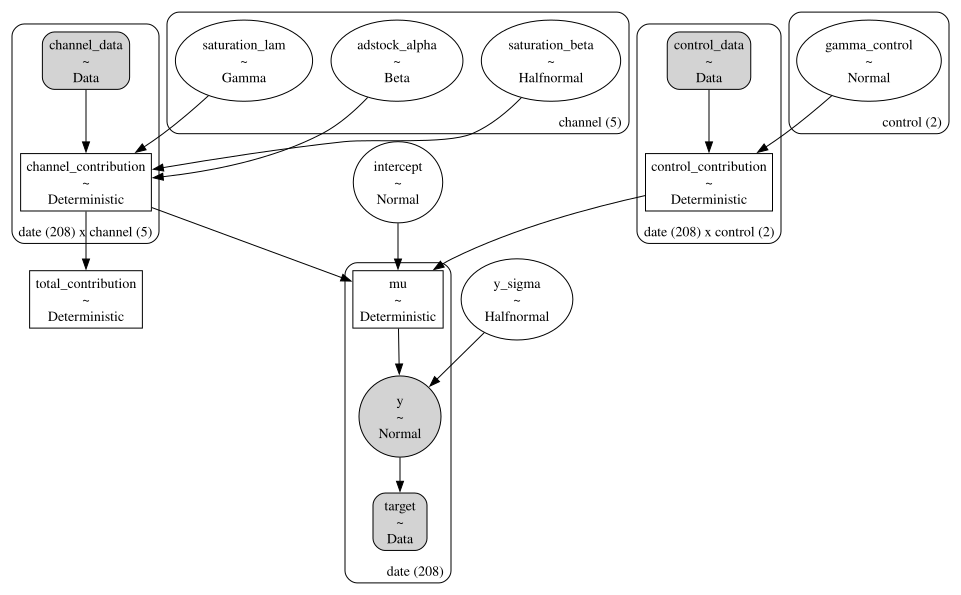

In [122]:
mmm.graphviz()

# Model Diagnostics

In [53]:
# Number of diverging samples
mmm.idata["sample_stats"]["diverging"].sum().item()

0

In [54]:
mmm.fit_result

<xarray.Dataset> Size: 27MB
Dimensions:               (chain: 2, draw: 1000, control: 2, channel: 5,
                           date: 208)
Coordinates:
  * chain                 (chain) int64 16B 0 1
  * draw                  (draw) int64 8kB 0 1 2 3 4 5 ... 995 996 997 998 999
  * control               (control) <U7 56B 't' 'holiday'
  * channel               (channel) <U10 200B 'tv_S' 'ooh_S' ... 'facebook_S'
  * date                  (date) datetime64[ns] 2kB 2015-11-23 ... 2019-11-11
Data variables:
    intercept             (chain, draw) float64 16kB 0.2119 0.1808 ... 0.1978
    gamma_control         (chain, draw, control) float64 32kB -0.1526 ... 0.11
    adstock_alpha         (chain, draw, channel) float64 80kB 0.6944 ... 0.6576
    saturation_lam        (chain, draw, channel) float64 80kB 8.356 ... 2.398
    saturation_beta       (chain, draw, channel) float64 80kB 0.2941 ... 0.4524
    y_sigma               (chain, draw) float64 16kB 0.08908 0.09977 ... 0.1035
    channel_contribution  (chain, draw, date, channel) float64 17MB 0.0555 .....
    total_contribution    (chain, draw) float64 16kB 69.95 67.04 ... 68.46 66.2
    control_contribution  (chain, draw, date, control) float64 7MB -0.0 ... 0.0
    mu                    (chain, draw, date) float64 3MB 0.3638 ... 0.5087
Attributes:
    created_at:                 2025-08-12T21:08:37.654095+00:00
    arviz_version:              0.22.0
    inference_library:          numpyro
    inference_library_version:  0.19.0
    sampling_time:              9.858124
    tuning_steps:               1000
    pymc_marketing_version:     0.15.1

In [55]:
az.summary(
    data=mmm.fit_result,
    var_names=[
        "intercept",
        "y_sigma",
        # "saturation_alpha",
        "saturation_lam",
        "adstock_alpha",
        "gamma_control",
        # "gamma_fourier",
    ],
)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
intercept,0.208,0.025,0.157,0.252,0.001,0.001,1818.0,1251.0,1.0
y_sigma,0.097,0.005,0.087,0.106,0.000,0.000,2162.0,1161.0,1.0
saturation_lam[tv_S],6.893,3.070,1.027,12.113,0.103,0.059,839.0,686.0,1.0
saturation_lam[ooh_S],2.789,1.896,0.077,6.149,0.041,0.046,1519.0,1076.0,1.0
saturation_lam[print_S],2.294,1.600,0.094,5.240,0.038,0.043,1370.0,960.0,1.0
saturation_lam[search_S],1.372,0.660,0.219,2.530,0.019,0.012,1032.0,1062.0,1.0
saturation_lam[facebook_S],2.123,1.264,0.303,4.345,0.030,0.032,1538.0,1413.0,1.0
adstock_alpha[tv_S],0.705,0.082,0.549,0.852,0.002,0.002,1542.0,1391.0,1.0
adstock_alpha[ooh_S],0.302,0.185,0.000,0.613,0.004,0.004,1915.0,891.0,1.0
adstock_alpha[print_S],0.289,0.216,0.000,0.692,0.005,0.004,1787.0,1093.0,1.0


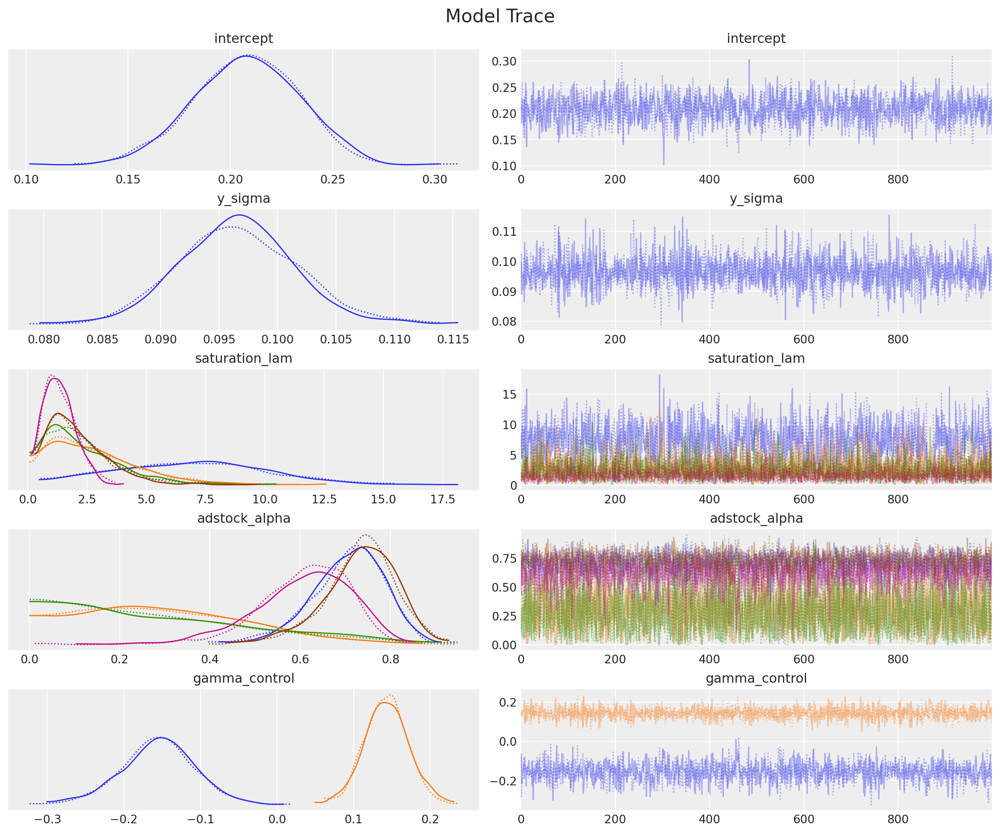

In [56]:
_ = az.plot_trace(
    data=mmm.fit_result,
    var_names=[
        "intercept",
        "y_sigma",
        # "saturation_alpha",
        "saturation_lam",
        "adstock_alpha",
        "gamma_control",
        # "gamma_fourier",
    ],
    compact=True,
    backend_kwargs={"figsize": (12, 10), "layout": "constrained"},
)
plt.gcf().suptitle("Model Trace", fontsize=16);

In [50]:
# X['DATE'] = pd.to_datetime(X['DATE'])

In [57]:
mmm.sample_posterior_predictive(X, extend_idata=True, combined=True)

Sampling: [y]


/Users/vadi/D/21.Projects/Portfolio 
Projects/MMM/MMM_git/MMM_portfolio/lib/python3.11/site-packages/rich/live.py:256: UserWarning: install "ipywidgets"
for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

<xarray.Dataset> Size: 3MB
Dimensions:  (sample: 2000, date: 208)
Coordinates:
  * date     (date) datetime64[ns] 2kB 2015-11-23 2015-11-30 ... 2019-11-11
  * sample   (sample) object 16kB MultiIndex
  * chain    (sample) int64 16kB 0 0 0 0 0 0 0 0 0 0 0 ... 1 1 1 1 1 1 1 1 1 1 1
  * draw     (sample) int64 16kB 0 1 2 3 4 5 6 7 ... 993 994 995 996 997 998 999
Data variables:
    y        (date, sample) float64 3MB 1.466e+06 1.445e+06 ... 1.808e+06
Attributes:
    created_at:                 2025-08-12T21:10:01.006574+00:00
    arviz_version:              0.22.0
    inference_library:          pymc
    inference_library_version:  5.25.1

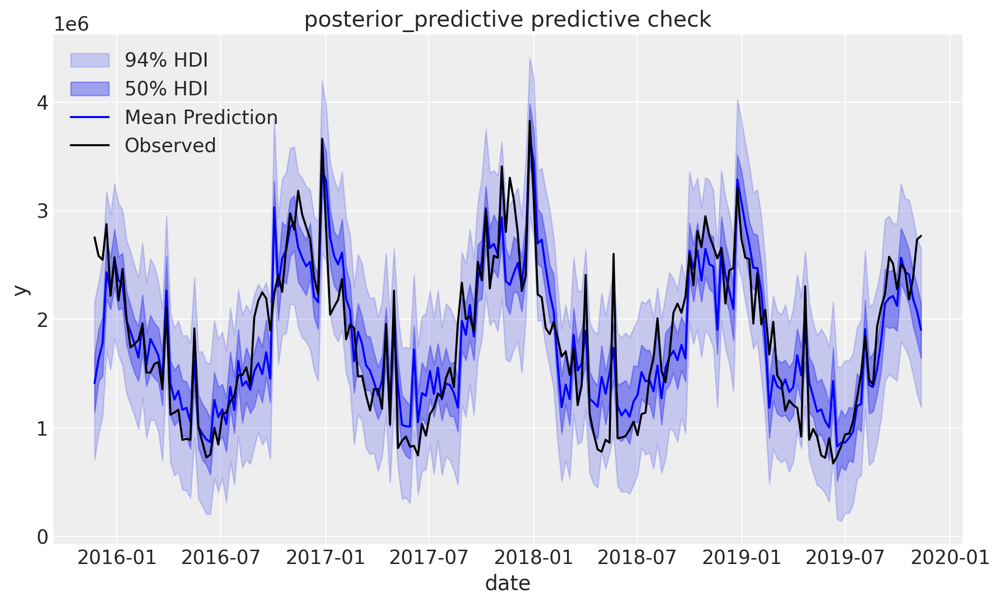

In [58]:
fig, ax = plt.subplots(figsize=(10, 6))
mmm.plot_posterior_predictive(ax=ax, original_scale=True);

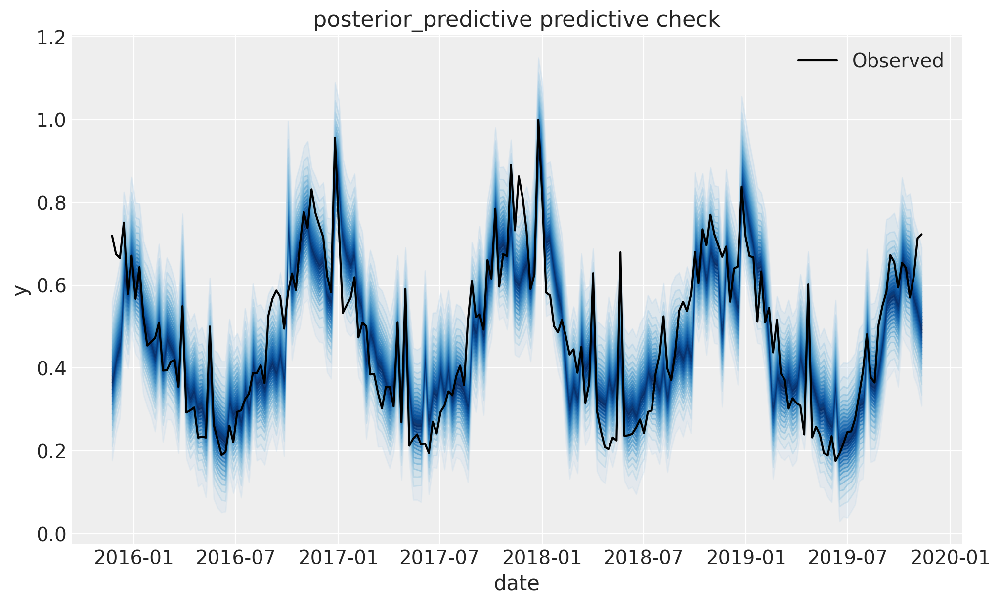

In [59]:
fig, ax = plt.subplots(figsize=(10, 6))
mmm.plot_posterior_predictive(ax=ax, add_mean=False, add_gradient=True);

As we can see we have a good model fitting

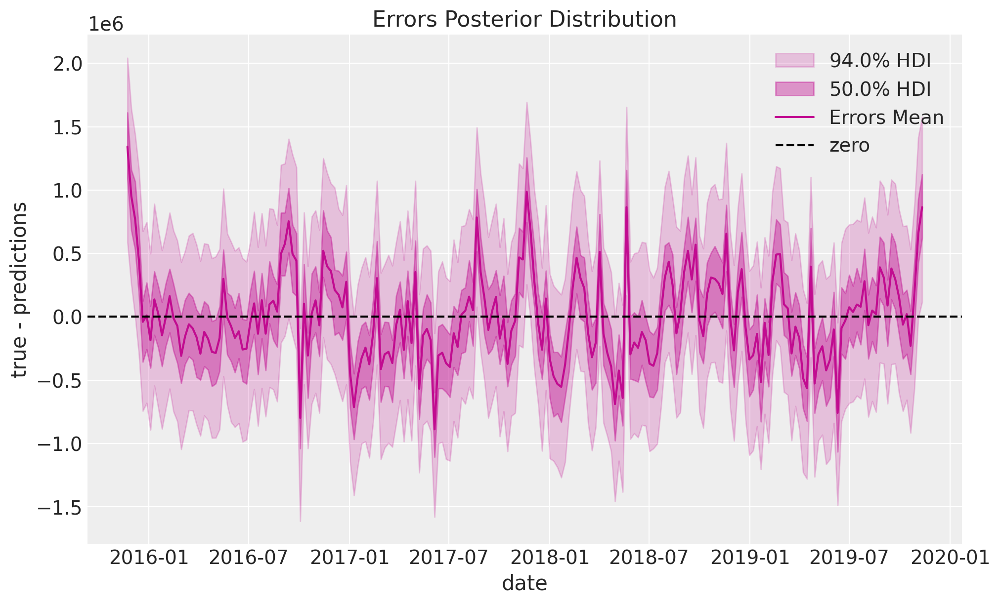

In [60]:
# plot model errors
fig, ax = plt.subplots(figsize=(10, 6))
mmm.plot_errors(ax=ax, original_scale=True);

In [61]:
errors = mmm.get_errors(original_scale=True)

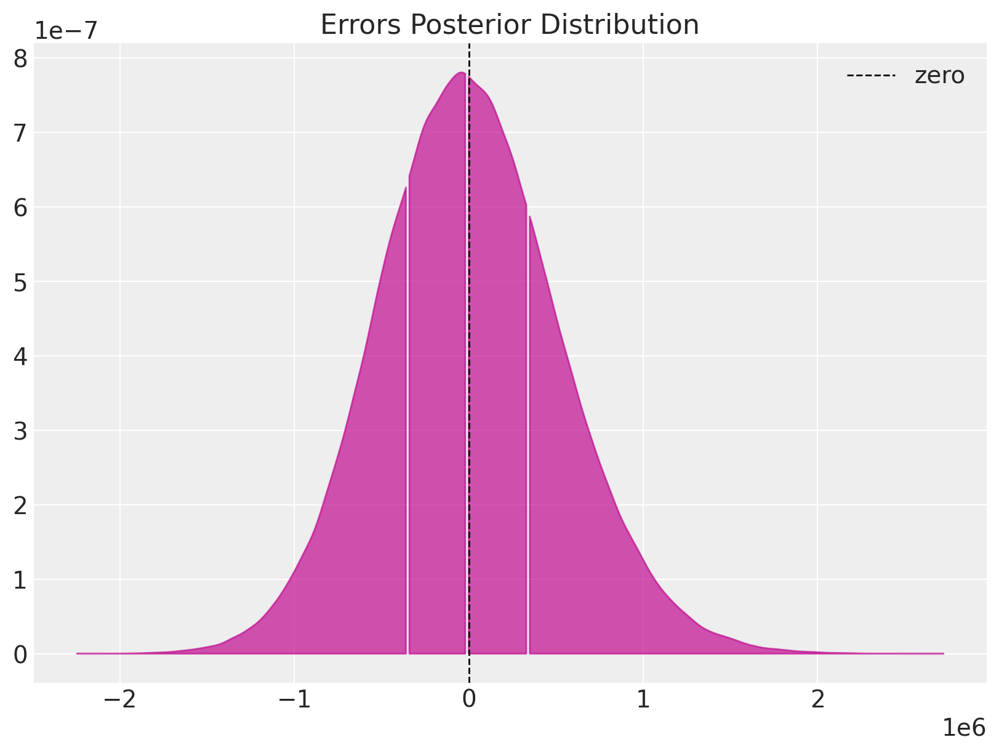

In [62]:
fig, ax = plt.subplots(figsize=(8, 6))
az.plot_dist(
    errors, quantiles=[0.25, 0.5, 0.75], color="C3", fill_kwargs={"alpha": 0.7}, ax=ax
)
ax.axvline(x=0, color="black", linestyle="--", linewidth=1, label="zero")
ax.legend()
ax.set(title="Errors Posterior Distribution");

In [63]:
# import matplotlib.pyplot as plt

plt.rcParams["figure.figsize"] = (10, 6)

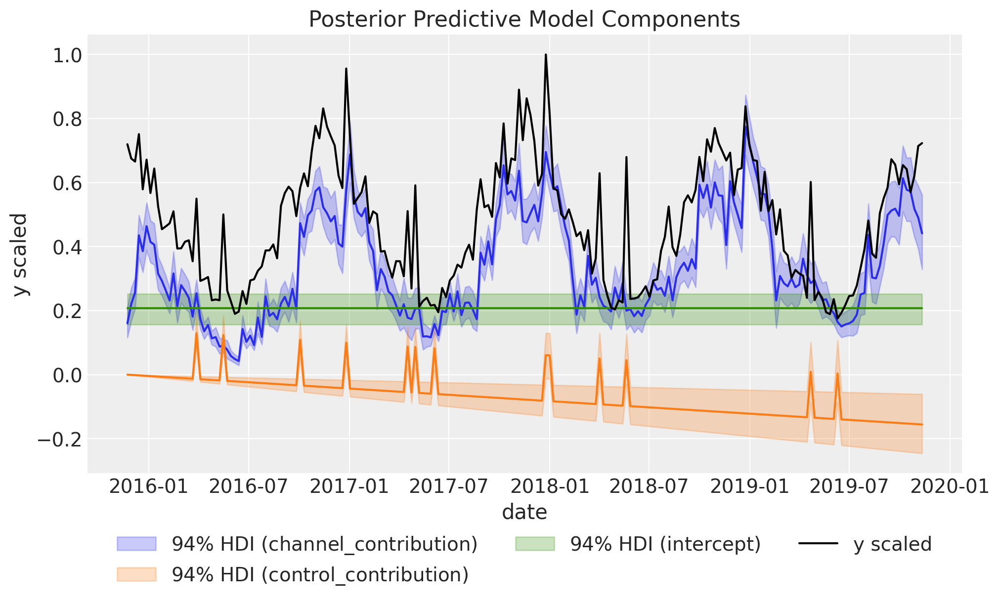

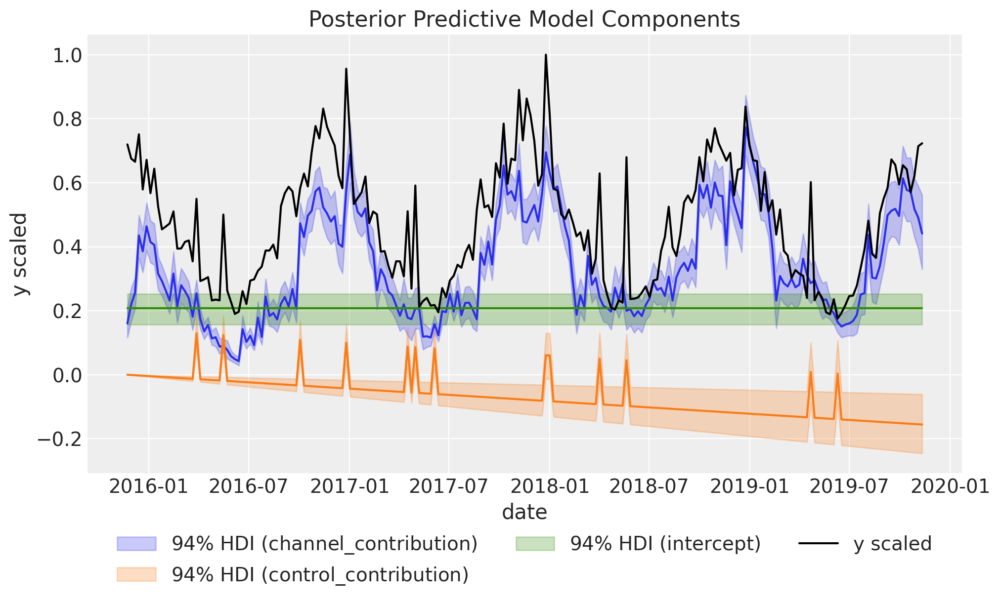

In [64]:

mmm.plot_components_contributions()


Control variable (competitor business) has higher impact on the company's revenue, followed next by channel contribution, this is also shown by the waterfall component graph shown next

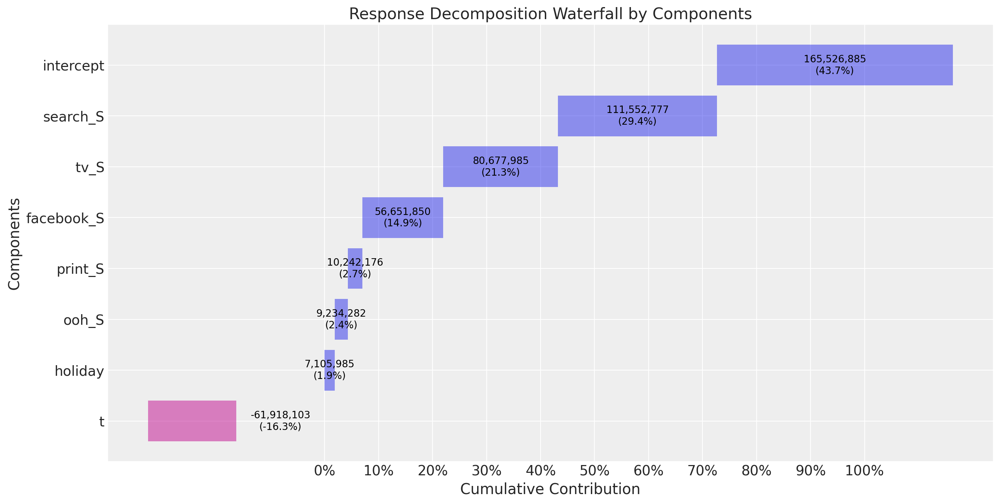

In [65]:
mmm.plot_waterfall_components_decomposition();

## Media Parameters


/Users/vadi/D/21.Projects/Portfolio Projects/MMM/MMM_git/MMM_portfolio/lib/python3.11/site-packages/scipy/_lib/_util.py:1279: RuntimeWarning: divide by zero encountered in vecdot
  return np.vecdot(x1, x2, axis=axis)
/Users/vadi/D/21.Projects/Portfolio Projects/MMM/MMM_git/MMM_portfolio/lib/python3.11/site-packages/scipy/_lib/_util.py:1279: RuntimeWarning: overflow encountered in vecdot
  return np.vecdot(x1, x2, axis=axis)
/Users/vadi/D/21.Projects/Portfolio Projects/MMM/MMM_git/MMM_portfolio/lib/python3.11/site-packages/scipy/_lib/_util.py:1279: RuntimeWarning: invalid value encountered in vecdot
  return np.vecdot(x1, x2, axis=axis)
/Users/vadi/D/21.Projects/Portfolio Projects/MMM/MMM_git/MMM_portfolio/lib/python3.11/site-packages/scipy/_lib/_util.py:1279: RuntimeWarning: divide by zero encountered in vecdot
  return np.vecdot(x1, x2, axis=axis)
/Users/vadi/D/21.Projects/Portfolio Projects/MMM/MMM_git/MMM_portfolio/lib/python3.11/site-packages/scipy/_lib/_util.py:1279: RuntimeWarnin

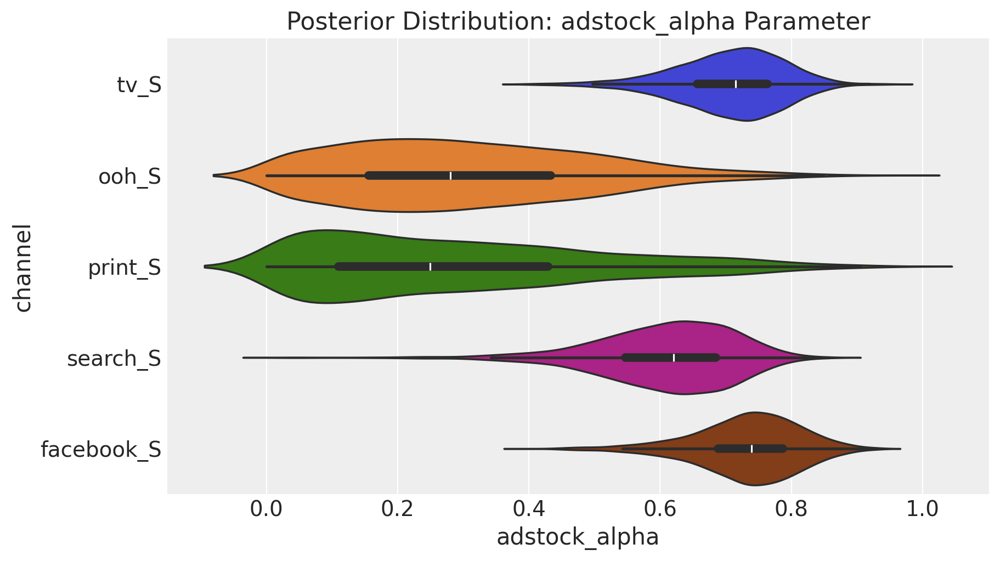

In [66]:
fig = mmm.plot_channel_parameter(param_name="adstock_alpha", figsize=(9, 5))
ax = fig.axes[0]
ax.legend(loc="upper right");

We can see from the figure that the alphas for ooh_s, print are lower when compared to others. This indicates that the effect of marketting decay is faster for these channels when compared to others.

/Users/vadi/D/21.Projects/Portfolio Projects/MMM/MMM_git/MMM_portfolio/lib/python3.11/site-packages/scipy/_lib/_util.py:1279: RuntimeWarning: divide by zero encountered in vecdot
  return np.vecdot(x1, x2, axis=axis)
/Users/vadi/D/21.Projects/Portfolio Projects/MMM/MMM_git/MMM_portfolio/lib/python3.11/site-packages/scipy/_lib/_util.py:1279: RuntimeWarning: overflow encountered in vecdot
  return np.vecdot(x1, x2, axis=axis)
/Users/vadi/D/21.Projects/Portfolio Projects/MMM/MMM_git/MMM_portfolio/lib/python3.11/site-packages/scipy/_lib/_util.py:1279: RuntimeWarning: invalid value encountered in vecdot
  return np.vecdot(x1, x2, axis=axis)
/Users/vadi/D/21.Projects/Portfolio Projects/MMM/MMM_git/MMM_portfolio/lib/python3.11/site-packages/scipy/_lib/_util.py:1279: RuntimeWarning: divide by zero encountered in vecdot
  return np.vecdot(x1, x2, axis=axis)
/Users/vadi/D/21.Projects/Portfolio Projects/MMM/MMM_git/MMM_portfolio/lib/python3.11/site-packages/scipy/_lib/_util.py:1279: RuntimeWarnin

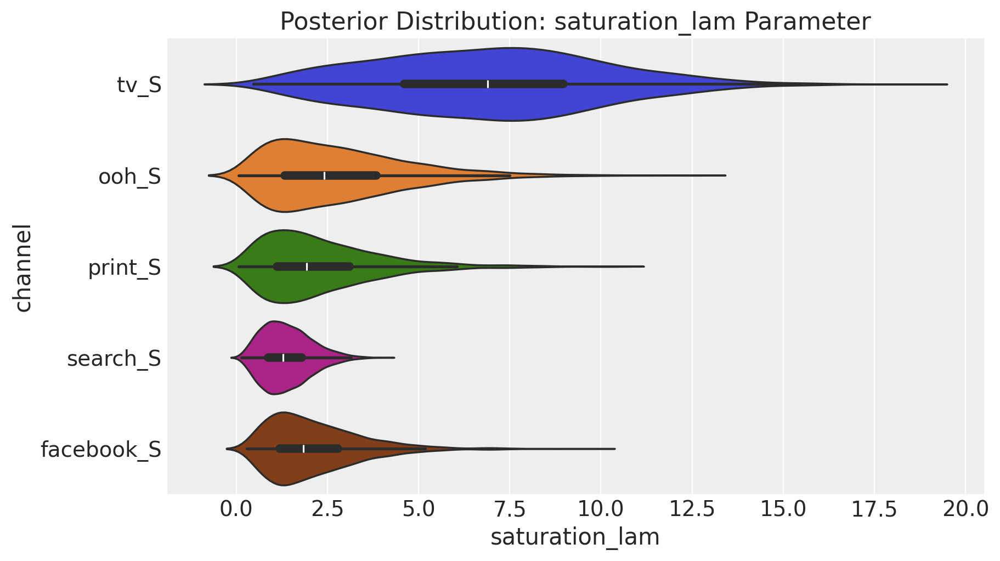

In [67]:
fig = mmm.plot_channel_parameter(param_name="saturation_lam", figsize=(9, 5))
ax = fig.axes[0]
# ax.axvline(x=lam1, color="C0", linestyle="--", label=r"$\lambda_1$")
# ax.axvline(x=lam2, color="C1", linestyle="--", label=r"$\lambda_2$")
ax.legend(loc="upper right");

The lambda parameter for saturation controls how quickly the diminishing returns are set with increasing spend. The high TV has higher lambda suggesting that the returns diminish at slower spend levels. The parameter for search is lowest indicating to gradual saturation effect.

## Channel Contribution share

/var/folders/dd/v3p3z41n6g74yrhn4sx83lc40000gn/T/ipykernel_59529/2426457809.py:15: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc="upper center", bbox_to_anchor=(0.5, -0.05), ncol=1);


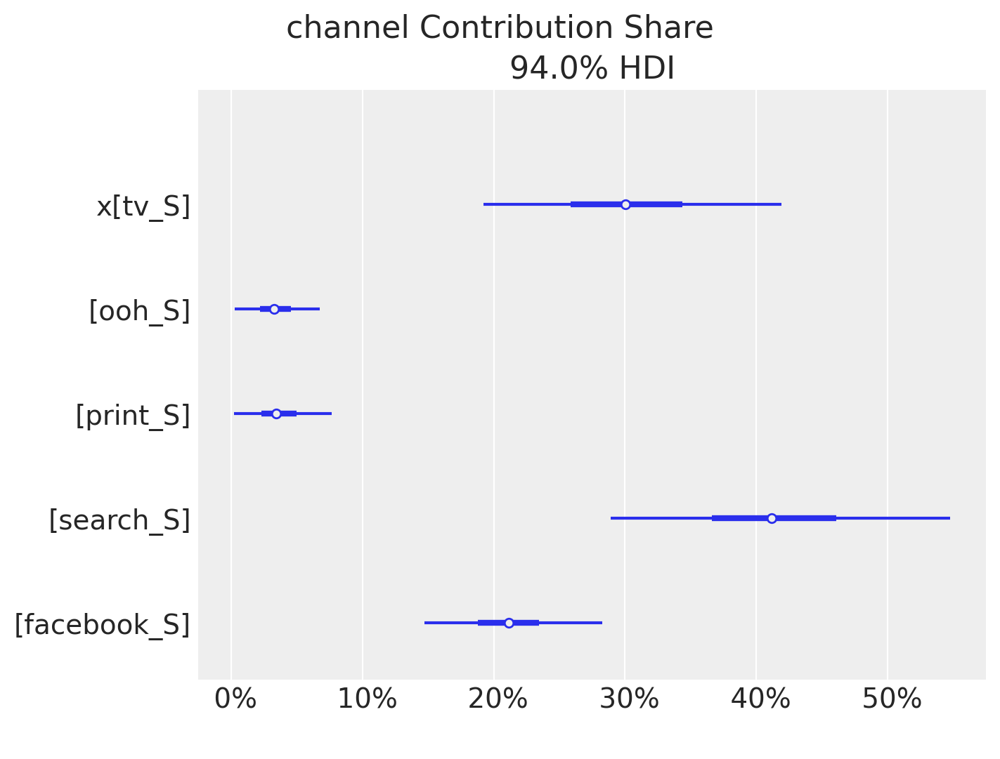

In [68]:
fig = mmm.plot_channel_contribution_share_hdi(figsize=(7, 5))
ax = fig.axes[0]
# ax.axvline(
#     x=contribution_share_x1,
#     color="C1",
#     linestyle="--",
#     label="true contribution share ($x_1$)",
# )
# ax.axvline(
#     x=contribution_share_x2,
#     color="C2",
#     linestyle="--",
#     label="true contribution share ($x_2$)",
# )
ax.legend(loc="upper center", bbox_to_anchor=(0.5, -0.05), ncol=1);

### Eventhough spend is more for ooh_S, the media share contribution is high for tv_S followed by search_S

Plot the relative contribution of each channel to the target variable

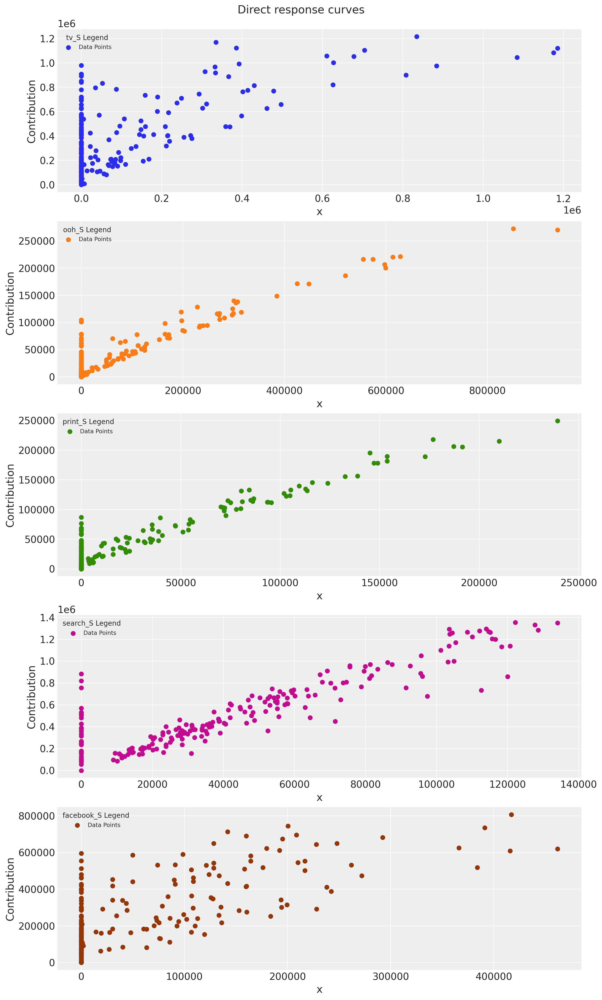

In [69]:
fig = mmm.plot_direct_contribution_curves()
[ax.set(xlabel="x") for ax in fig.axes];

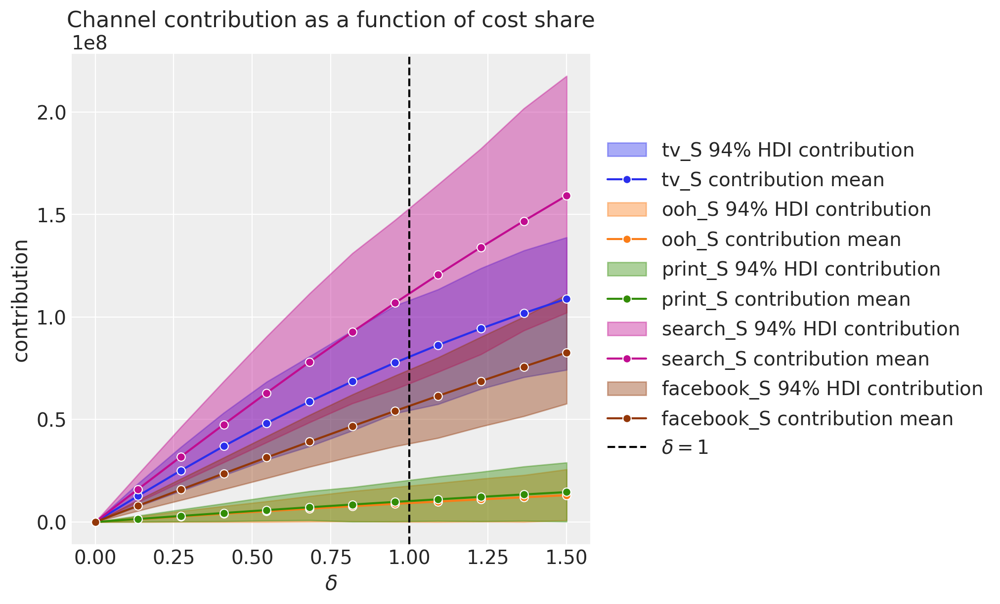

In [70]:
mmm.plot_channel_contribution_grid(start=0, stop=1.5, num=12);

### ROAS (Revenue on Adverstising Spend)

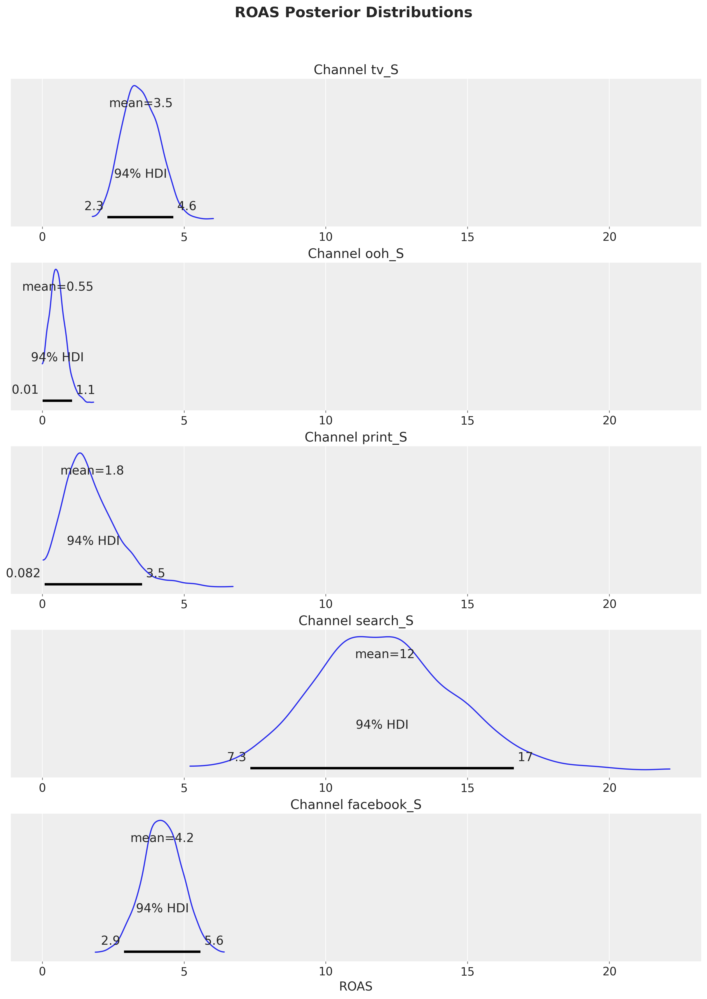

In [71]:
channel_contribution_original_scale = mmm.compute_channel_contribution_original_scale()
spend_sum = X[['tv_S', 'ooh_S', 'print_S', 'search_S', 'facebook_S']].sum().to_numpy()

roas_samples = (
    channel_contribution_original_scale.sum(dim="date")
    / spend_sum[np.newaxis, np.newaxis, :]
)

fig, axes = plt.subplots(
    nrows=5, ncols=1, figsize=(12, 16), sharex=True, sharey=False, layout="constrained"
)
az.plot_posterior(roas_samples, ax=axes)
axes[0].set(title="Channel tv_S")
axes[1].set(title="Channel ooh_S")
axes[2].set(title="Channel print_S")
axes[3].set(title="Channel search_S")
axes[4].set(title="Channel facebook_S", xlabel="ROAS")
fig.suptitle("ROAS Posterior Distributions", fontsize=18, fontweight="bold", y=1.06);

In [72]:
contributions = mmm.compute_channel_contribution_original_scale()
print(contributions.coords['channel'].values)

['tv_S' 'ooh_S' 'print_S' 'search_S' 'facebook_S']


In [73]:
import numpy as np

mean_roas = roas_samples.mean(dim=("chain", "draw")).values
channels = ['tv_S', 'ooh_S', 'print_S', 'search_S', 'facebook_S']

# Combine into a result table
import pandas as pd
roas_df = pd.DataFrame({
    "Channel": channels,
    "Mean_ROAS": mean_roas
}).sort_values(by="Mean_ROAS", ascending=False)

print(roas_df)

      Channel  Mean_ROAS
3    search_S  12.088249
4  facebook_S   4.231253
0        tv_S   3.484083
2     print_S   1.760833
1       ooh_S   0.547866


## Save Model

In [74]:
mmm.save("model1.nc") # save the model

In [69]:
# !pip install -q watermark

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 27.8 MB/s eta 0:00:00


In [70]:
# %load_ext watermark
# %watermark -n -u -v -iv -w -p pytensor

Last updated: Tue Aug 12 2025

Python implementation: CPython
Python version       : 3.11.13
IPython version      : 7.34.0

pytensor: 2.31.7

sklearn       : 1.6.1
seaborn       : 0.13.2
pandas        : 2.2.2
arviz         : 0.22.0
pymc_marketing: 0.15.1
matplotlib    : 3.10.0
pymc          : 5.25.1
numpy         : 2.0.2

Watermark: 2.5.0



## Budget Allocation

In [75]:
import warnings

import arviz as az
import matplotlib.pyplot as plt
import numpy as np

from pymc_marketing.mmm import MMM

warnings.filterwarnings("ignore")

az.style.use("arviz-darkgrid")
plt.rcParams["figure.figsize"] = [12, 7]
plt.rcParams["figure.dpi"] = 100

%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = "retina"

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [78]:
# load the saved model
mmm = MMM.load("model1.nc")

In [79]:
channels = ['tv_S', 'ooh_S', 'print_S', 'search_S', 'facebook_S']

## Calculate return on Ad spend

In [80]:
get_mean_contributions_over_time_df = mmm.compute_mean_contributions_over_time(original_scale=True)

channel_contribution_original_scale = mmm.compute_channel_contribution_original_scale()

roas_samples = (
    channel_contribution_original_scale.stack(sample=("chain", "draw")).sum("date")
    / X[['tv_S', 'ooh_S', 'print_S', 'search_S', 'facebook_S']].sum().to_numpy()[..., None]
)

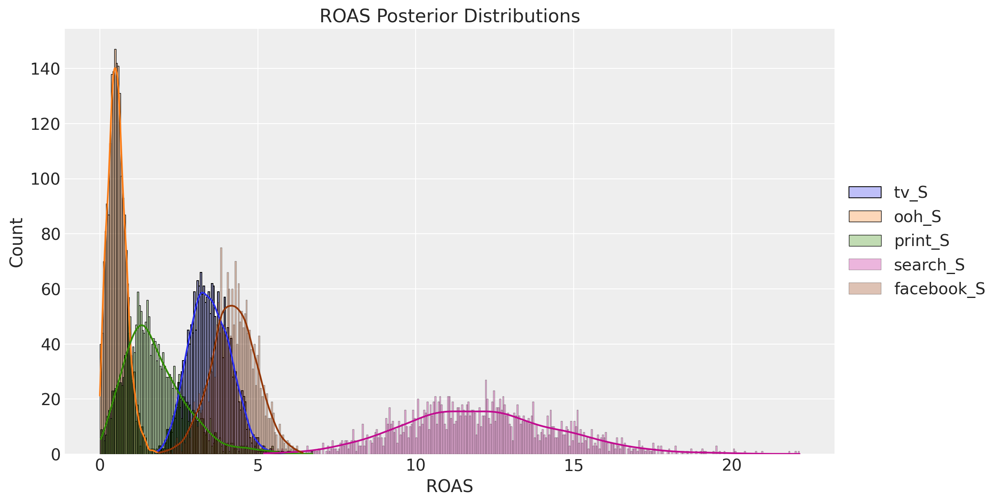

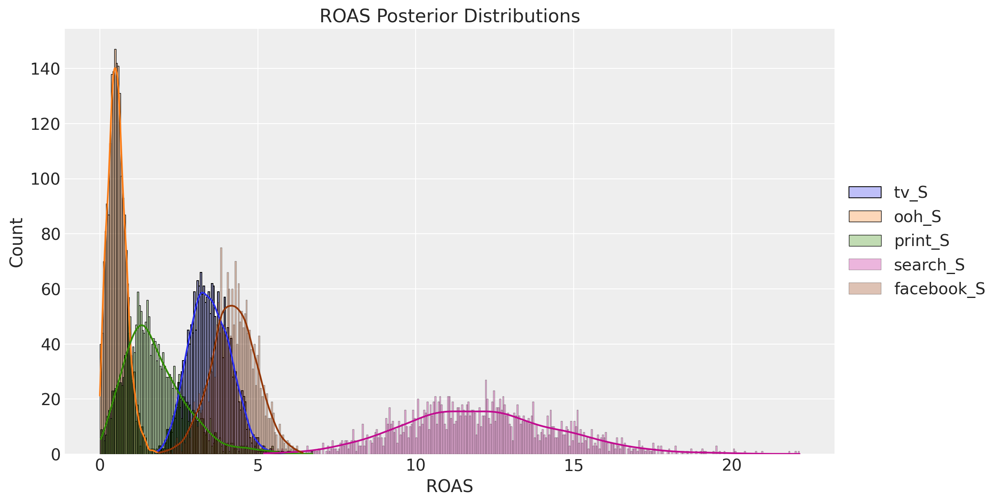

In [81]:
fig, ax = plt.subplots(figsize=(12, 6))
for channel in ['tv_S', 'ooh_S', 'print_S', 'search_S', 'facebook_S']:
    sns.histplot(
        roas_samples.sel(channel=channel).to_numpy(),
        binwidth=0.05, alpha=0.3, kde=True, ax=ax,
        legend=True, label=channel
    )
ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
ax.set(xlabel="ROAS", title="ROAS Posterior Distributions")
fig

As we can see above the best ROAS (Return on Ad spend) is by search and the worst is by ooh

In [82]:
# ROAS summary

roas_df = roas_samples.to_dataframe(name="roas")
print(roas_df.groupby("channel").mean())
print(roas_df.groupby("channel")['roas'].describe(percentiles=[0.025, 0.975]))

            chain   draw       roas
channel                            
facebook_S    0.5  499.5   4.231253
ooh_S         0.5  499.5   0.547866
print_S       0.5  499.5   1.760833
search_S      0.5  499.5  12.088249
tv_S          0.5  499.5   3.484083
             count       mean       std       min      2.5%        50%  \
channel                                                                  
facebook_S  2000.0   4.231253  0.719957  1.868612  2.804672   4.231010   
ooh_S       2000.0   0.547866  0.293491  0.000593  0.072554   0.521053   
print_S     2000.0   1.760833  1.009316  0.025791  0.293833   1.564939   
search_S    2000.0  12.088249  2.528570  5.195548  7.554854  11.966265   
tv_S        2000.0   3.484083  0.643837  1.764544  2.328419   3.453687   

                97.5%        max  
channel                           
facebook_S   5.672523   6.423102  
ooh_S        1.211989   1.813705  
print_S      4.310126   6.734584  
search_S    17.387546  22.150571  
tv_S         4.7528

In [85]:
#!!! IMPORTANT
# The code next gives error, for this modify the error file as required using below code
# try:
#     from pymc.pytensorf import rvs_in_graph
# except ImportError:
#     from pymc.logprob.utils import rvs_in_graph

## Budget Optimization with channel level constraints

In [86]:
from pymc_marketing.mmm.budget_optimizer import optimizer_xarray_builder

time_unit_budget = 1000000  # Imagine is 5K or 5M
campaign_period = 48  # Imagine 8 weeks for this case
print(
    f"Total budget for the {campaign_period} Weeks: {time_unit_budget * campaign_period}M"
)
# Define your channels
# The initial split per channel
budget_per_channel = time_unit_budget / len(channels)
# Initial budget per channel as dictionary.
initial_budget = optimizer_xarray_builder(
    np.array([budget_per_channel, budget_per_channel, budget_per_channel, budget_per_channel, budget_per_channel]),
    channel = channels ,
)  # Using this function we can create the iniall allocation strategy for each channel

# bounds for each channel
min_budget, max_budget = 25000, 550000
budget_bounds = optimizer_xarray_builder(
    np.array([[min_budget, max_budget], [min_budget, max_budget],[min_budget, max_budget], [min_budget, max_budget], [min_budget, max_budget]]),
    channel=channels,
    bound=["lower", "upper"],
)  # Using this function we can create a budget bounds for each channel as well

Total budget for the 48 Weeks: 48000000M


In [87]:
model_granularity = "weekly"
allocation_strategy, optimization_result = mmm.optimize_budget(
    budget=time_unit_budget,
    num_periods=campaign_period,
    budget_bounds=budget_bounds,
)

response = mmm.sample_response_distribution(
    # allocation_strategy can be a dict or an xarray.DataArray
    # (e.g. optimizer_xarray_builder(value=[1, 2], channel=["x1", "x2"]))
    allocation_strategy=allocation_strategy,
    time_granularity=model_granularity,
    num_periods=campaign_period,
    noise_level=0.01,
)

In [88]:
budget_per_channel

200000.0

In [89]:
allocation_strategy

<xarray.DataArray (channel: 5)> Size: 40B
array([207489.54111904,  25000.        ,  58806.72785313, 442313.10459328,
       266390.62643454])
Coordinates:
  * channel  (channel) <U10 200B 'tv_S' 'ooh_S' ... 'search_S' 'facebook_S'

In [90]:
print("\n=== Budget Allocation Summary ===\n")
for channel, budget in response.allocation.to_dataframe().iterrows():
    print(f"Channel {channel:>2}: {budget['allocation']:>8.2f}M")
print("\n" + "-" * 30)
print(f"Total Budget: {sum(response.allocation.to_numpy()):>8.2f}M")
print("-" * 30)


=== Budget Allocation Summary ===

Channel tv_S: 207489.54M
Channel ooh_S: 25000.00M
Channel print_S: 58806.73M
Channel search_S: 442313.10M
Channel facebook_S: 266390.63M

------------------------------
Total Budget: 1000000.00M
------------------------------


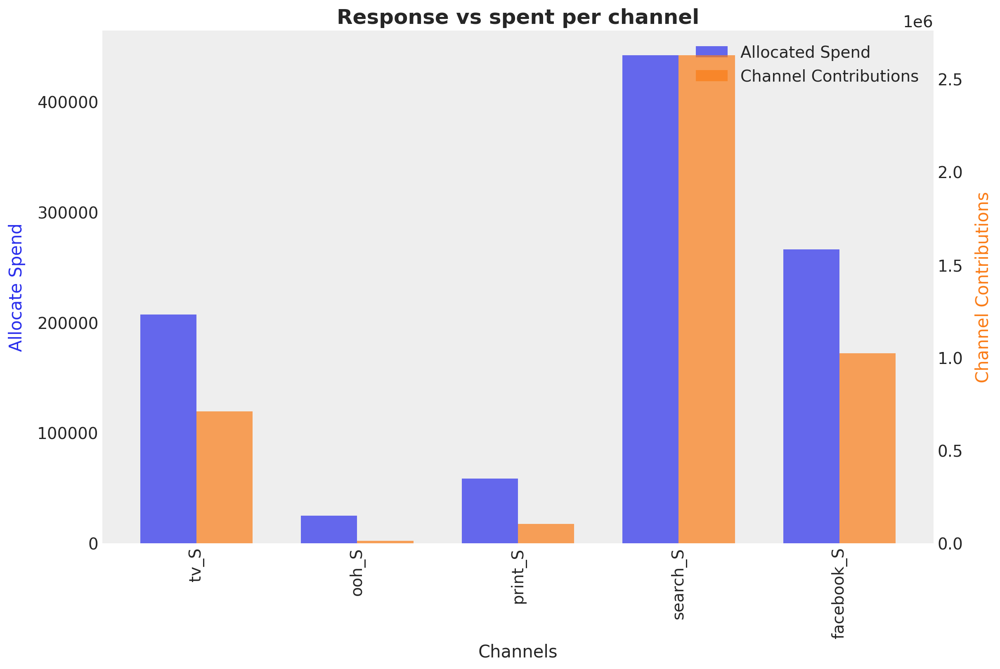

In [91]:
fig, ax = mmm.plot_budget_allocation(samples=response, figsize=(12, 8))
ax.set_title("Response vs spent per channel", fontsize=18, fontweight="bold");

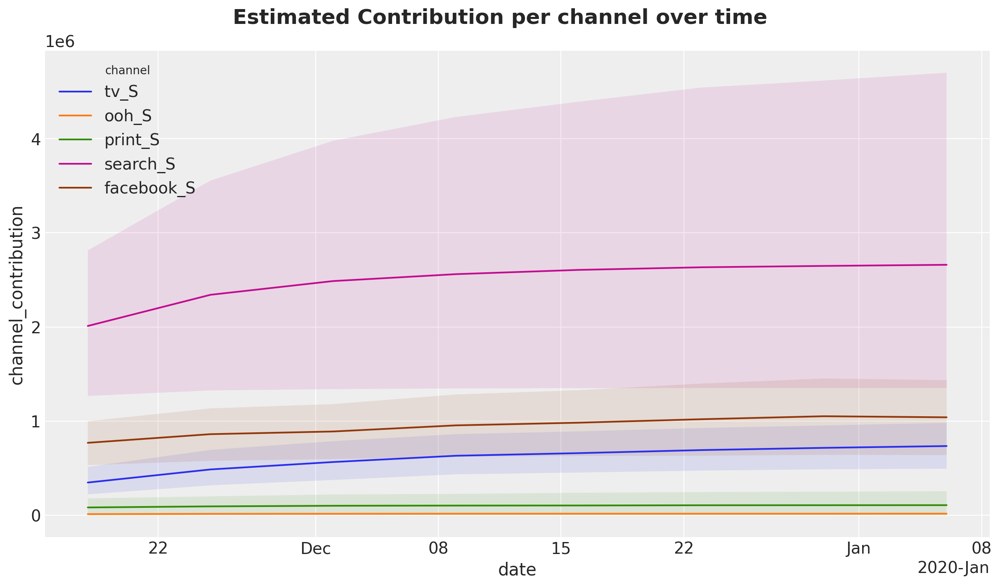

In [92]:
# Slice first x weeks
x =8
first_x = response.isel(date=slice(0, x))

fig = mmm.plot_allocated_contribution_by_channel(samples=first_x)
fig.suptitle(
    "Estimated Contribution per channel over time", fontsize=18, fontweight="bold"
);

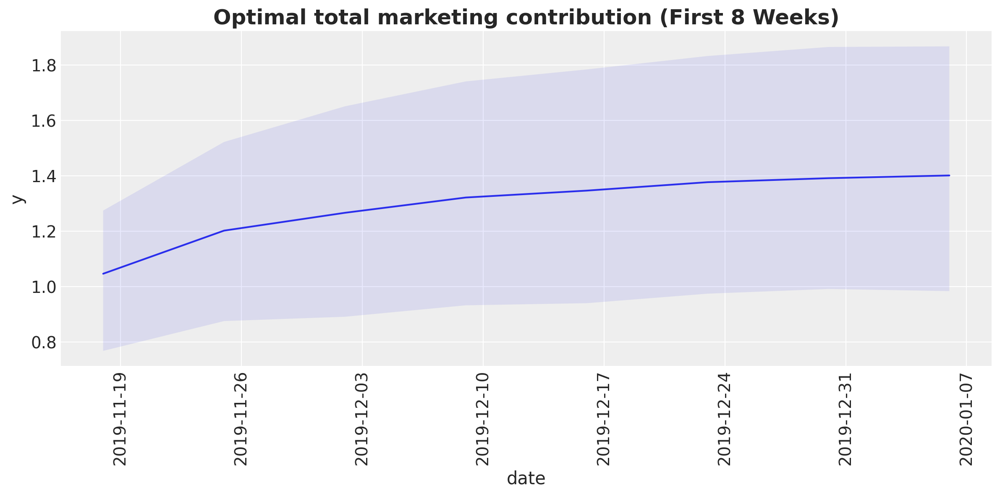

In [93]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Slice first x weeks
x =8
first_x = response.isel(date=slice(0, x))

fig, ax = plt.subplots(figsize=(12, 6))

# Plot mean for first 8 weeks
first_x["y"].mean(dim="sample").plot(ax=ax)

# Fill between for first 8 weeks
ax.fill_between(
    x=first_x.y.date.values,
    y1=first_x.y.quantile(0.025, dim="sample"),
    y2=first_x.y.quantile(0.95, dim="sample"),
    alpha=0.1,
)

ax.set_title(f"Optimal total marketing contribution (First {x} Weeks)", fontsize=18, fontweight="bold")

# Force weekly ticks
ax.xaxis.set_major_locator(mdates.WeekdayLocator(interval=1))
ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m-%d"))

plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

## Budget scenarios

Sometimes we want to keep the budget same, decrease the budget when the market conditions are not favourable, increase the budget if the market is more favourable


Optimization for budget: 200000.00M
Optimization for budget: 400000.00M
Optimization for budget: 600000.00M
Optimization for budget: 1200000.00M


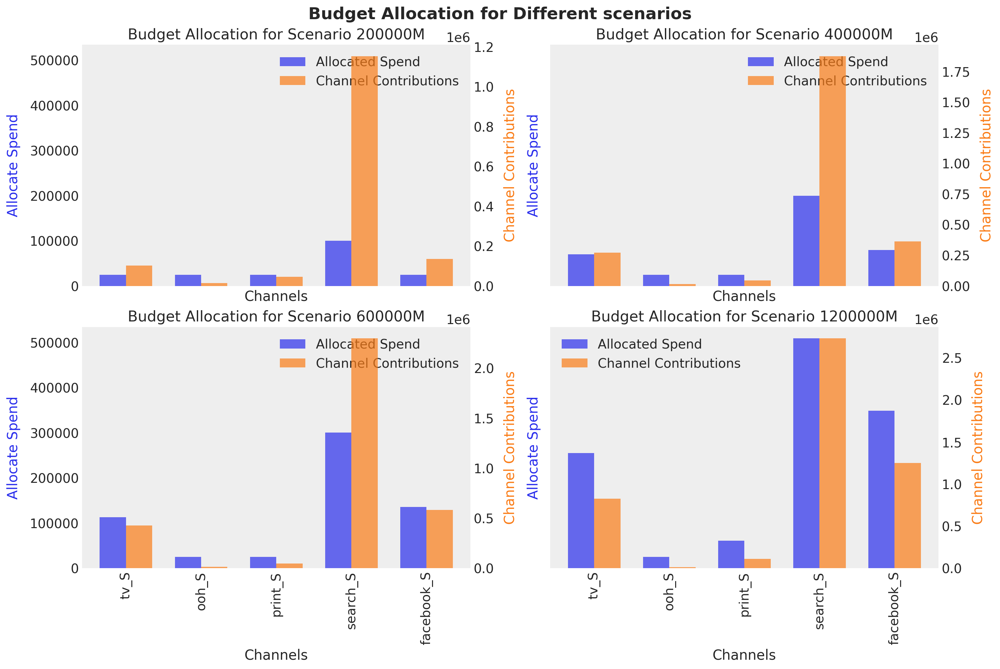

In [94]:
scenarios = np.array([0.2, 0.4, 0.6, 1.2])

fig, axes = plt.subplots(
    nrows=2, ncols=2, figsize=(15, 10), sharex=True, sharey=True, layout="constrained"
)

channel_contribution_per_allocated_spend = {}

for i, scenario in enumerate(scenarios):
    tmp_budget = time_unit_budget * scenario
    print(f"Optimization for budget: {tmp_budget:.2f}M")
    tmp_allocation_strategy, tmp_optimization_result = mmm.optimize_budget(
        budget=tmp_budget,
        num_periods=campaign_period,
        budget_bounds=budget_bounds,
    )

    tmp_response = mmm.sample_response_distribution(
        allocation_strategy=tmp_allocation_strategy,
        time_granularity=model_granularity,
        num_periods=campaign_period,
        noise_level=0.01,
    )

    #compute allocated spend & channel contribution
    allocated_spend = tmp_response.allocation.to_numpy()

    channel_contribution = (
            tmp_response["channel_contribution"].mean(dim=["date", "sample"]).to_numpy()
        )

    channel_contribution *= mmm.get_target_transformer()["scaler"].scale_

    channel_contribution_per_allocated_spend[scenario] = channel_contribution / allocated_spend



    row = i // 2
    col = i % 2
    _, ax = mmm.plot_budget_allocation(samples=tmp_response, ax=axes[row, col])
    ax.set_title(f"Budget Allocation for Scenario {tmp_budget:.0f}M")

fig.suptitle(
    "Budget Allocation for Different scenarios", fontsize=18, fontweight="bold"
);

In [95]:
channel_contribution_per_allocated_spend_df = pd.DataFrame(channel_contribution_per_allocated_spend, index=channels)

In [96]:
channel_contribution_per_allocated_spend_df

,0.2,0.4,0.6,1.2
tv_S,4.089277,3.898665,3.756660,3.236570
ooh_S,0.588575,0.588488,0.588825,0.587441
print_S,1.861134,1.862535,1.859653,1.784930
search_S,11.538766,9.375740,7.644673,5.362612
facebook_S,5.434339,4.562471,4.295893,3.579583


As we can see with lower budgets the channel contribution ratio is more

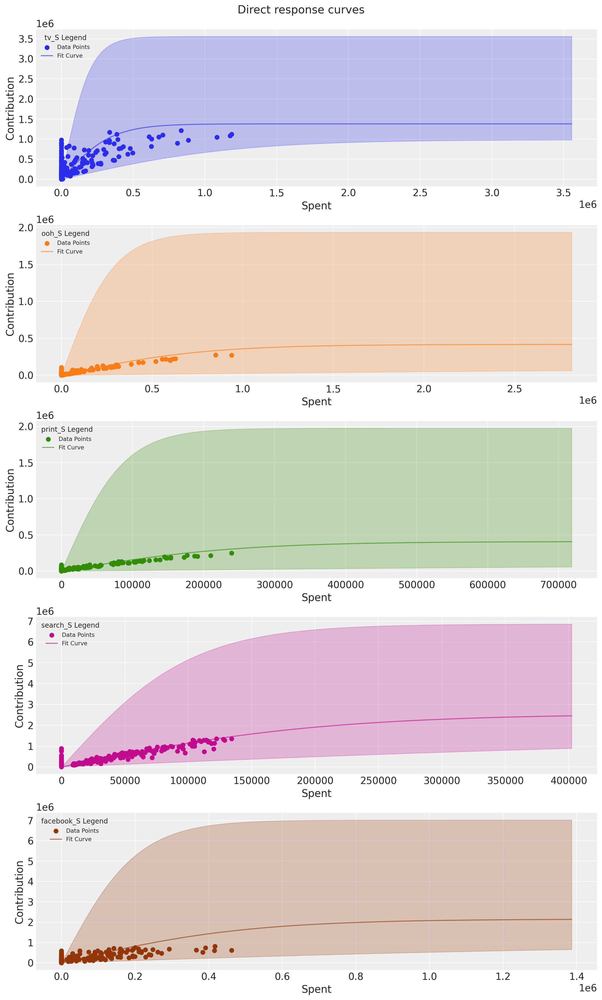

In [97]:
sigmoid_response_curve_fig = mmm.plot_direct_contribution_curves(
    show_fit=True, xlim_max=3
);

As we can see in the above plots the channel tv hits the plateau with around 500,000 and channel search around 1.5 million